In [ ]:
#Mounting Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classififer using TensorFlow 2.0 and TensorflowHub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When i'm sitting at a cafe and i'm taking a photo of a dog I wanna know which breed the dog is.

## 2. Data

Data from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction prob for each dog breed of each test image.

Multi Class Log loss

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning.
* 120 breeds of dogs, 120 different classes.
* 10,000+ images in the training set. (these have labels.)
* 10,000+ images in the test set (these have no labels, we want to predict them.)

## Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure to use a GPU ✅

In [ ]:
#Import necessary tools
import tensorflow as tf
print("TF version:", tf.__version__)
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU", "available (YES!!!" if tf.config.list_physical_devices("GPU") else "not available")



TF version: 2.12.0
TF Hub version: 0.13.0
GPU available (YES!!!


## Getting the Data Ready (turning into Tensors)

* Turning the Data into Tensors (numerical representation)

First, let's start by accessing our data and checking out the labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv['breed'].value_counts().head()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
Name: breed, dtype: int64

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
#Let's view an image
from IPython.display import Image
#Image('/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg') #path

## Getting images and their labels
Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Check whether number of filenmaes matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/")) == len(labels_csv["id"]):
  print("FIlenames match actual amount of files! Proceed")
else:
  print("Filenames do not match the actual amount of files! Check the directory.")
  print("I am going to check and drop the id's IF THEY do not match....")
  id_list = [element + ".jpg" for element in labels_csv["id"]]

  if set(os.listdir("/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/")) != set(id_list):
    print("...........")
    print("The lists have different elements.")
    diff_elements = set(id_list) - set(os.listdir("/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/"))
    print("These are the different elements:\n", diff_elements)
    remove_ids = [elem.replace('.jpg', '') for elem in diff_elements]
    labels_csv = labels_csv.drop(labels_csv[labels_csv['id'].isin(remove_ids)].index)
    print("Different IDs removed Successfully, Run Again to check.")
  else:
    print("...........")
    print("...........")
    print("The lists have the same elements. HURRAY!")

      



Filenames do not match the actual amount of files! Check the directory.
I am going to check and drop the id's IF THEY do not match....
...........
The lists have different elements.
These are the different elements:
 {'f988271af1ca0e21b76b8cb318bcf4b3.jpg', 'f7df3e61cec435ef6066e9d18b5c17b1.jpg', 'ff52a3909f5801a71161cec95d213107.jpg', 'fb7160e2b5699b6c1548f2f7232f4774.jpg', 'fee98c990f4d69c6a8467dd0f0668440.jpg', 'f7850cfce0e0d79627dfb63d71d97b72.jpg'}
Different IDs removed Successfully, Run Again to check.


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 

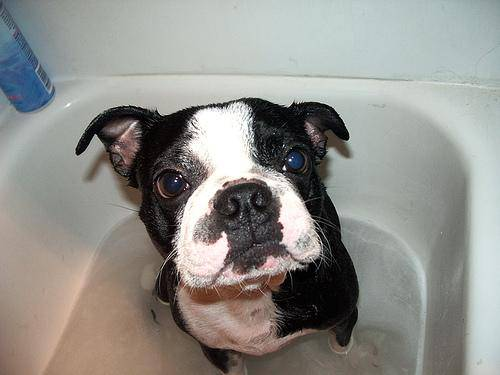

In [ ]:
# One more check
Image(filenames[10000])

In [ ]:
labels_csv["breed"][10000]

'pembroke'

Let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels), len(filenames)

(10216, 10216)

In [ ]:
# See if number of labels matches the number of filenames.
if len(labels) == len(filenames):
  print("Number of labels = filenames! LESGO")
else:
  print("Number of labels != filenames. CHECK AGAIN BRO")

Number of labels = filenames! LESGO


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
print(boolean_labels[:2])
print(len(boolean_labels))

[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False]), array([False, False, False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


We're creating our own validation set (by splitting training set in order to practice on some data before testing)

In [ ]:
# Validation set SPLIT (train_test_split) sklearn using NUM_IMAGES
X = filenames
Y = boolean_labels

In [ ]:
# Set number of images to use for experimenting:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10001, step:1000}

In [ ]:
# Splitting with sklearn
from sklearn.model_selection import train_test_split

# Split into training and validation of total size NUM IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fals

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

In [ ]:
# Convert image to a NumPy array
from matplotlib.pyplot import imread

image = imread(filenames[100])
image.shape

(500, 500, 3)

In [ ]:
image[:2]

array([[[ 1,  0,  0],
        [26, 25, 23],
        [ 1,  0,  0],
        ...,
        [ 0,  0,  0],
        [10, 10,  8],
        [ 7,  7,  5]],

       [[ 1,  0,  0],
        [11, 10,  8],
        [15, 14, 12],
        ...,
        [15, 15, 13],
        [ 0,  0,  0],
        [ 9,  9,  7]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2] #you can transofrm pretty everything into a tensor through tf.constant

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 1,  0,  0],
        [26, 25, 23],
        [ 1,  0,  0],
        ...,
        [ 0,  0,  0],
        [10, 10,  8],
        [ 7,  7,  5]],

       [[ 1,  0,  0],
        [11, 10,  8],
        [15, 14, 12],
        ...,
        [15, 15, 13],
        [ 0,  0,  0],
        [ 9,  9,  7]]], dtype=uint8)>

Let's make a function to preprocess images.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`


In [ ]:
# Define image size
IMG_SIZE = 224 # feed data in the same shape as the one with which the model has been trained

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path) # io = input/output
  # Turn the jpeg image into a numerical Tensor with 3 colour channel (RGB)
  image = tf.image.decode_jpeg(image, channels = 3) # 3 --> R, G, B
  # Convert the colour channel values from 0-250 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning Data into Batches

Why? To not fit one single image at a time. They might not fit into memory.

So we do about 32 images at a time (or manually adjust this number)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this: (image, label).

In [ ]:
# Create a very simple function to return the tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(Y[42])) #image, label in a tuple of tensors

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: *(image, label)*, let's make a function to turn all of our data into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't if it's validation data.
  Also accepts test data as inpuut (no labels).
  '''
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(Y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(Y))) # labels)
    # Shuffling pathnames and labels before mapping image processor function
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch                                           

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25
  for i in range(25):
    # Create subplots (5 rows, 5 cols)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()]) # see below
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
unique_breeds[Y[150].argmax()] # of the labels in index 150, it gives you the maximum value which is True in this case and then apply this index at the unique_breeds vector to find the actual breed.

'borzoi'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) #to un-batch data and turn them into iterator

In [ ]:
len(train_images), len(train_labels)

(32, 32)

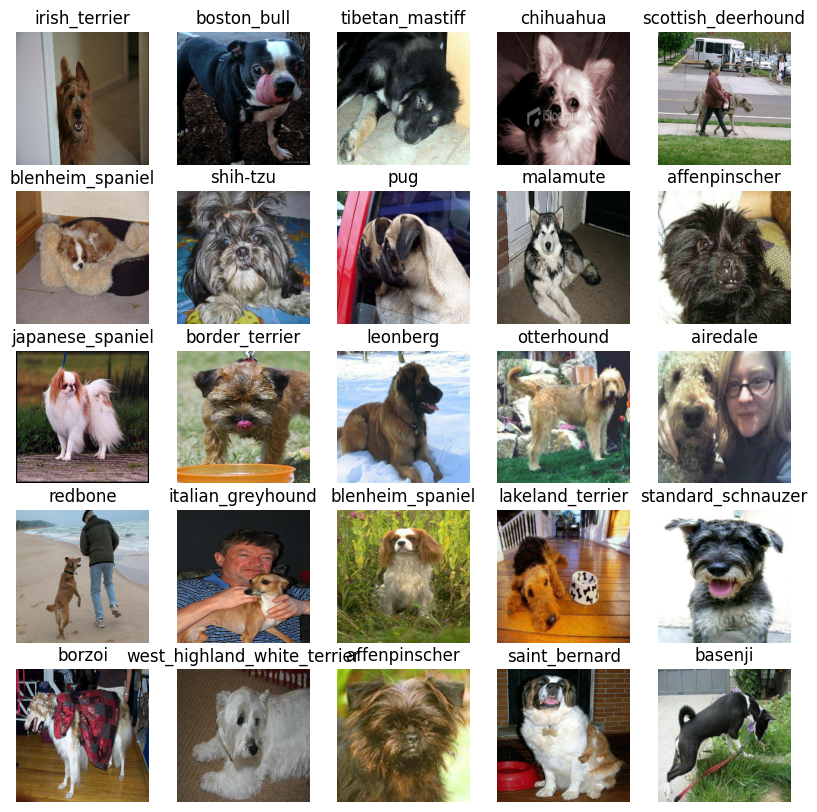

In [ ]:
# Visualize and explore our data in a training batch.
show_25_images(train_images, train_labels)

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())

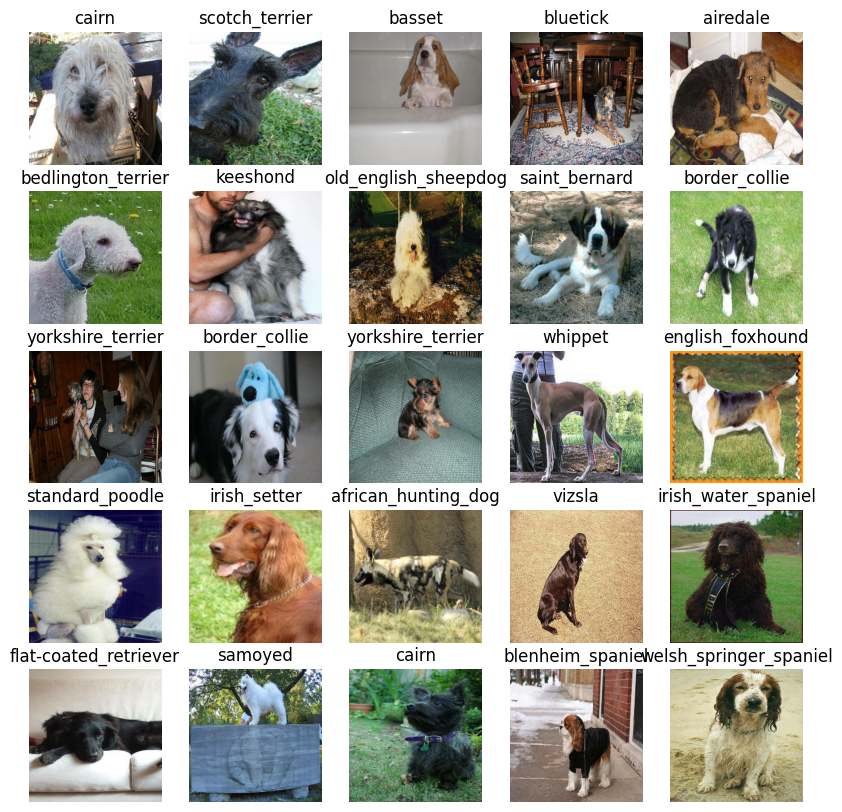

In [ ]:
show_25_images(val_images, val_labels)

## Building a Model

We're taking an existing model and applying it to our needs.

We need:
* Input shape (our images shape, in the form of Tensors) to our model.
* Output shape (image labels, in the form of Tensors) of our model.
* URL od the model we want to use. - https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup Model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"



### Keras deep learning model.

Let's create a function which:
* Takes the input shape, output shape and model.
* Defines the layers in a Keras model in sequential fashion.
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

*Documentation: https://www.tensorflow.org/guide/keras/sequential_model* 

In [ ]:
#KERAS
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer which contains the TFHub model which performs many operations of Convolution, trained on ImageNet Dataset.
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, #this is the shape of our output, 120 breeds
                            activation="softmax") # Layer 2 (output layer), using softmax for multi-class classification.
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), # ADAM great general optimizer
      metrics=["Accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


What happens in the summary?
* Why non-trainable? Because using transfer learning they're already trained for the mobilenetv2. There are many different hidden layers inside on which the model was originally trained using ConvNN in order to encode pictures into a flattened 1,1,224^2*3 vector.
* Finally, we train our Dense layer with 120,240 parameters using our data but bansed on what the algorithm learned on the ImageNet Data.

In [ ]:
outputs = np.ones(shape=(1,1,5))
outputs

array([[[1., 1., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if model stops improving.

We'll create two callbacks, one for Tensorboard which helps track our model prgress and another for early stopping which prevents our model for training for too long.

### Tensorboard callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback.
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


#### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_Accuracy",
                                                  patience=5) # stops after 3 rounds of no improvements

## Training the Model

Our first model is going to be trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:110, step:10}

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/100
25/25 [==============================] - 9s 194ms/step - loss: 4.6959 - Accuracy: 0.0787 - val_loss: 3.6439 - val_Accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 147ms/step - loss: 1.7533 - Accuracy: 0.6687 - val_loss: 2.3343 - val_Accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 169ms/step - loss: 0.6021 - Accuracy: 0.9287 - val_loss: 1.7979 - val_Accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 3s 122ms/step - loss: 0.2666 - Accuracy: 0.9887 - val_loss: 1.5884 - val_Accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1488 - Accuracy: 0.9987 - val_loss: 1.5145 - val_Accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1030 - Accuracy: 0.9987 - val_loss: 1.4713 - val_Accuracy: 0.6550


## Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Data/Dog\ Vision/logs --port=6006

<IPython.core.display.Javascript object>

In [ ]:
#!lsof -i:6006

In [ ]:
#!kill PID "PID"

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 95ms/step


array([[7.9699168e-03, 4.0776446e-03, 3.0127977e-04, ..., 1.4347369e-04,
        4.4812812e-04, 1.7965299e-03],
       [4.9761945e-04, 6.8077561e-04, 4.9329636e-04, ..., 7.9171779e-04,
        4.5085771e-04, 6.6719536e-04],
       [1.4616160e-05, 3.1530074e-04, 4.2691670e-04, ..., 1.7098871e-03,
        1.0578928e-04, 1.9310949e-03],
       ...,
       [1.6386370e-04, 5.7064686e-03, 9.2280778e-04, ..., 8.5896277e-04,
        8.9629577e-04, 2.1601326e-03],
       [7.9379906e-04, 4.1261184e-04, 1.5582021e-04, ..., 1.4364369e-03,
        6.9041544e-04, 3.0079270e-02],
       [2.6796972e-03, 8.7097229e-05, 2.2494572e-03, ..., 5.0871028e-03,
        2.2427470e-04, 1.1606769e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0] # The highest value in here is the most probable. dog breed.

array([7.96991680e-03, 4.07764455e-03, 3.01279768e-04, 4.51833243e-04,
       4.21601348e-04, 7.14326045e-04, 1.25231678e-02, 4.83920192e-03,
       2.78149586e-04, 1.30040816e-03, 2.74863280e-03, 2.35185900e-04,
       8.25079158e-04, 2.60020988e-05, 4.66084166e-05, 2.65849285e-05,
       2.30316073e-04, 9.20926407e-03, 1.01788307e-03, 1.51417946e-04,
       1.31780282e-03, 5.43728762e-04, 1.13599373e-04, 5.92042040e-03,
       1.00035002e-04, 4.80654591e-04, 2.62066901e-01, 1.42140401e-04,
       6.15467667e-04, 3.23622982e-04, 9.15138589e-05, 4.16879542e-04,
       4.16177827e-05, 4.57931863e-04, 1.63874371e-04, 3.90581042e-02,
       2.89983524e-04, 1.84396398e-04, 1.83704728e-03, 3.71376609e-06,
       2.00082519e-04, 1.17088584e-05, 2.02418829e-04, 4.04212842e-05,
       1.47175509e-04, 7.58139868e-05, 1.50251784e-04, 3.41683597e-04,
       3.18625290e-03, 4.56678245e-04, 1.08588574e-04, 1.03118415e-04,
       4.50820290e-03, 3.10816569e-04, 6.41045408e-05, 1.63880941e-05,
      

This is the result of the soft-max activation function.

In [ ]:
# First prediction
index = 130
#print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.38132959604263306
Sum: 1.0
Max index: 97
Predicted label: scottish_deerhound


In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[1])
pred_label

'scotch_terrier'

We'll do the same for the validation images and validation labels. Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using `unbatch()`) and then turn it into an iterator using `as_numpy_iterator()`

In [ ]:
# Function to unbatch a batched dataset.
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[1], val_labels[1]

(array([[[0.96018916, 0.97587544, 0.979797  ],
         [0.9617217 , 0.977408  , 0.98132956],
         [0.9651424 , 0.9808287 , 0.9847503 ],
         ...,
         [0.95294124, 0.9725491 , 0.9960785 ],
         [0.94906336, 0.9686712 , 0.9922006 ],
         [0.94802153, 0.9676294 , 0.9911588 ]],
 
        [[0.97587544, 0.9915617 , 0.9954833 ],
         [0.9765078 , 0.99219406, 0.9961156 ],
         [0.9802049 , 0.99589115, 0.99981266],
         ...,
         [0.96018916, 0.979797  , 1.        ],
         [0.9563113 , 0.9759191 , 0.9994114 ],
         [0.95366776, 0.9732756 , 0.99680495]],
 
        [[0.9686275 , 0.9843138 , 0.98823535],
         [0.9689829 , 0.98466915, 0.9885907 ],
         [0.972765  , 0.9884513 , 0.9923729 ],
         ...,
         [0.9677083 , 0.98731613, 1.        ],
         [0.9650211 , 0.9846289 , 1.        ],
         [0.9610995 , 0.98070735, 0.9960785 ]],
 
        ...,
 
        [[0.29487073, 0.40404442, 0.24774945],
         [0.13160652, 0.22889124, 0.11186

Nailed it!

Now we've got ways to get:

- Prediction labels
- Validation labels (truth labels)
- Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

- Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
- Convert the prediction probabilities to a predicted label.
- Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, true_labels, images, n=1):
    
    pred_prob, true_label, image = prediction_probabilities[n], true_labels[n], images[n]
    
    # Get the pred label
    pred_label= get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
      color="green"
    else:
      color="red"
    
    plt.title("{} {:2.0f}% ({})".format(pred_label,
                                        np.max(pred_prob)*100,
                                        true_label),
                                        color=color)



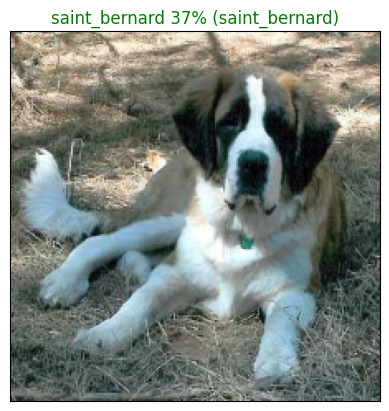

In [ ]:
# Example of prediction, original image and truth label:
plot_pred(prediction_probabilities=predictions,
          true_labels=val_labels,
          images=val_images,
          n=8)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

- Take an input of a prediction probabilities array, a ground truth labels array and an integer.
- Find the predicted label using get_pred_label().
- Find the top 10:
  - Prediction probabilities indexes
  - Prediction probabilities values
  - Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # !!!!!!!!
  
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes] # !!!!!!!
  
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes] # !!!!!!

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

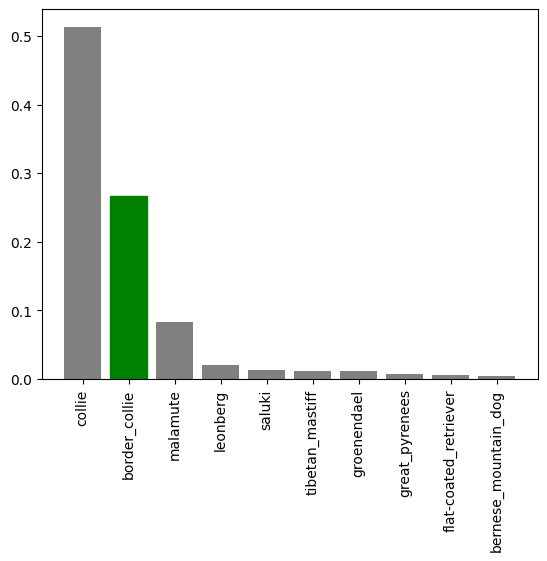

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

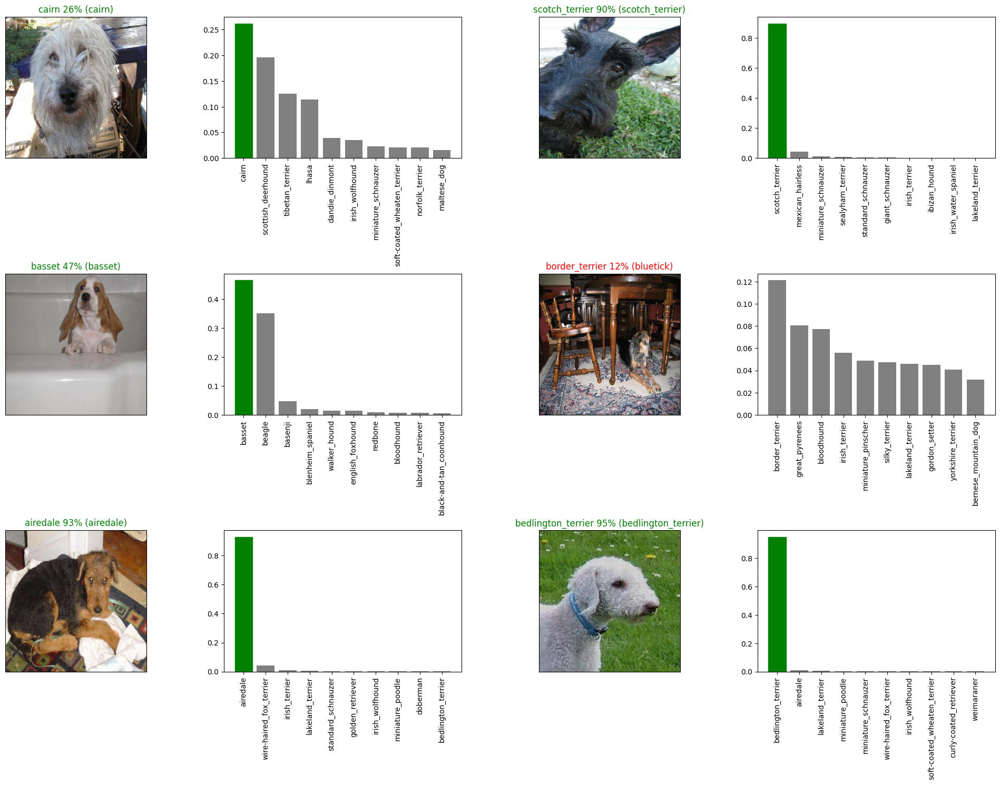

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            true_labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a Model

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the `tf.keras.models.load_model()` function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20230510-17111683738719-1000-images-Adam.h5...


'drive/My Drive/Data/models/20230510-17111683738719-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/Data/models/20230510-17111683738719-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Data/models/20230510-17111683738719-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 121ms/step - loss: 1.4713 - Accuracy: 0.6550


[1.4712916612625122, 0.6549999713897705]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 3s 114ms/step - loss: 1.4713 - Accuracy: 0.6550


[1.4712916612625122, 0.6549999713897705]

## Training a model (on the full data)

In [ ]:
len(X), len(Y)

(10216, 10216)

In [ ]:
full_data = create_data_batches(X, Y)

Creating training data batches...


In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="Accuracy",
                                                             patience=3)

In [ ]:
%tensorboard --logdir drive/My\ Drive/Data/Dog\ Vision/logs

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 35s 107ms/step - loss: 0.0483 - Accuracy: 0.9944
Epoch 2/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0383 - Accuracy: 0.9960
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0314 - Accuracy: 0.9970
Epoch 4/100
320/320 [==============================] - 39s 120ms/step - loss: 0.0257 - Accuracy: 0.9983


## Saving and reloading the full model

In [ ]:
# Save the full model
save_model(full_model, suffix="all-images-adam")

Saving model to: drive/My Drive/Data/models/20230510-17371683740236-all-images-adam.h5...


'drive/My Drive/Data/models/20230510-17371683740236-all-images-adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20230510-17371683740236-all-images-adam.h5')

Loading saved model from: drive/My Drive/Data/models/20230510-17371683740236-all-images-adam.h5


## Making predictions on the test dataset

In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste68da487dabcd11874830a177e8b6218.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/testdddb2b191e1b1de4867f6f5e81236312.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/testdcbe4226672aa4af80c1e52a9bb78268.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste2d65ef41ec9a649c8dbd92f0b821163.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/testdcdaf98ba8979ac0373d6dce63872053.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste46f65254fdf01d5fe732068c844efbd.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste458d6133dd1b436b047f86910f7fe34.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste5ba665e01b6927411d60158f28160dd.jpg',
 '/content/drive/MyDrive/Data/Dog Vision/dog-breed-identification/teste4b8eb057df510fa776516de19c9fa92.jpg',
 '/content/drive/My

In [ ]:
len(test_filenames)

10358

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**Note: Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.**

In [ ]:
# Make predictions on test data batch using the loaded full model

# test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
# Check out the test predictions

# test_predictions[:10]

## Making predictions on custom images

- Get the filepaths of our own images.
- Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
- Pass the custom image data batch to our model's predict() method.
- Convert the prediction output probabilities to prediction labels.
- Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Data/dogz/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever',
 'pug',
 'french_bulldog',
 'german_short-haired_pointer',
 'pembroke',
 'bull_mastiff',
 'pug',
 'english_foxhound']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
len(custom_images)

8

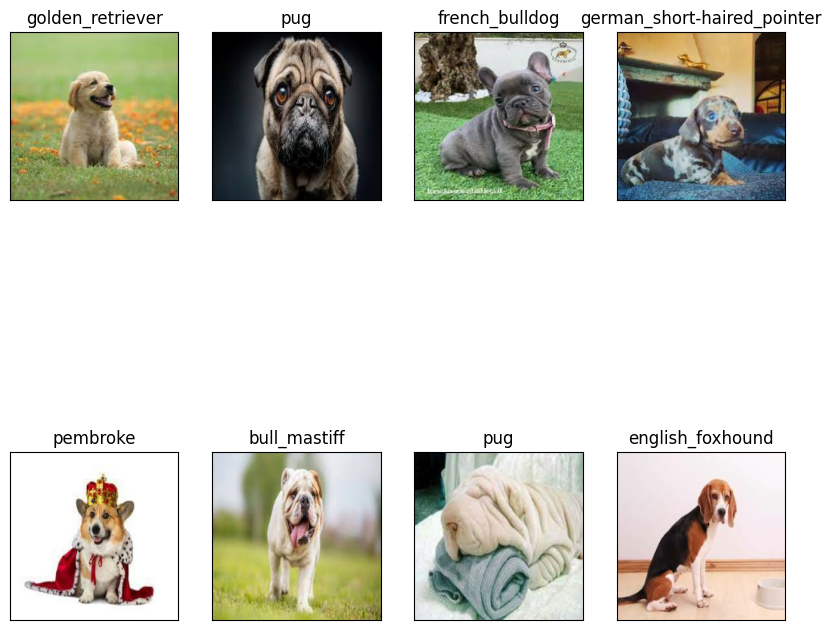

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

# FIN.